In [138]:

import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import networkx as nx
import pandas as pd
import networkx.algorithms.community as nx_comm
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

In [140]:
datos = r"C:\Users\melan\Downloads\Coactivation_matrix.mat"

In [142]:
m_jason = scipy.io.loadmat(datos)

In [144]:
m_dict = {k:v for k, v in m_jason.items() if k[0] != '_'}
m_dict = {k:v for k, v in m_jason.items() if k[0] != '_'}
m_dict

{'Coactivation_matrix': array([[0.        , 0.16071429, 0.11148649, ..., 0.        , 0.05045872,
         0.1011236 ],
        [0.16071429, 0.        , 0.06825939, ..., 0.        , 0.        ,
         0.06923077],
        [0.11148649, 0.06825939, 0.        , ..., 0.03412969, 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.03412969, ..., 0.        , 0.        ,
         0.        ],
        [0.05045872, 0.        , 0.        , ..., 0.        , 0.        ,
         0.09777778],
        [0.1011236 , 0.06923077, 0.        , ..., 0.        , 0.09777778,
         0.        ]]),
 'Coord': array([[ 7.24363636, 37.01090909,  9.42545455],
        [ 7.98653199, 46.22222222, 15.60942761],
        [ 7.55725191, 33.83206107, 23.51145038],
        ...,
        [-4.92385787, 15.31979695, 27.73604061],
        [-6.27312775, 34.70484581, -5.09251101],
        [-4.53874539, 46.53874539,  3.06273063]])}

In [146]:
m_dict.keys()

dict_keys(['Coactivation_matrix', 'Coord'])

In [148]:
# DINENSIONES 
comat= m_jason['Coactivation_matrix']
coordenadas = m_jason['Coord']
comat_shape = comat.shape
coord_shape= coordenadas.shape

comat_shape, coord_shape



((638, 638), (638, 3))

In [150]:
# EJERCICIO 1
# Definir grafos con la matriz estableciendo umbrales de coactivación de 0.8, 0.9 y 1 y graficar cada grafo. 
# Añadir las coordenadas tridimensionales (incluidas en el archivo.mat).

Grafo con umbral 0.8: 0 aristas y 638 nodos.


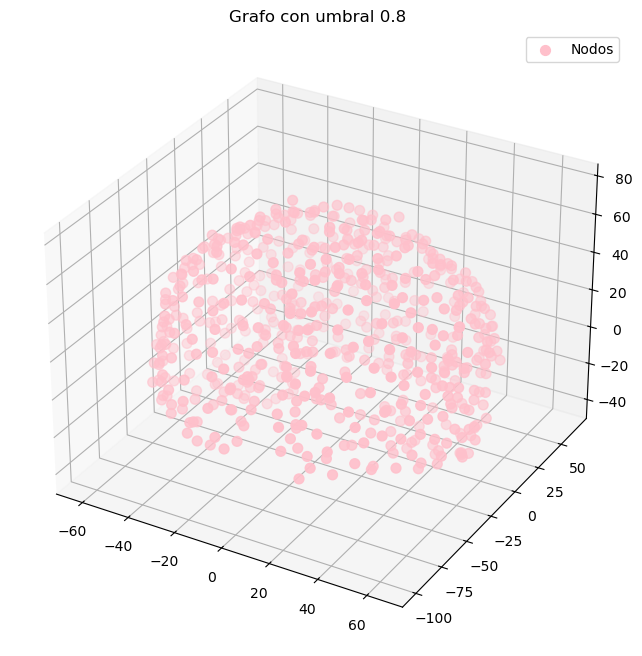

Grafo con umbral 0.9: 0 aristas y 638 nodos.


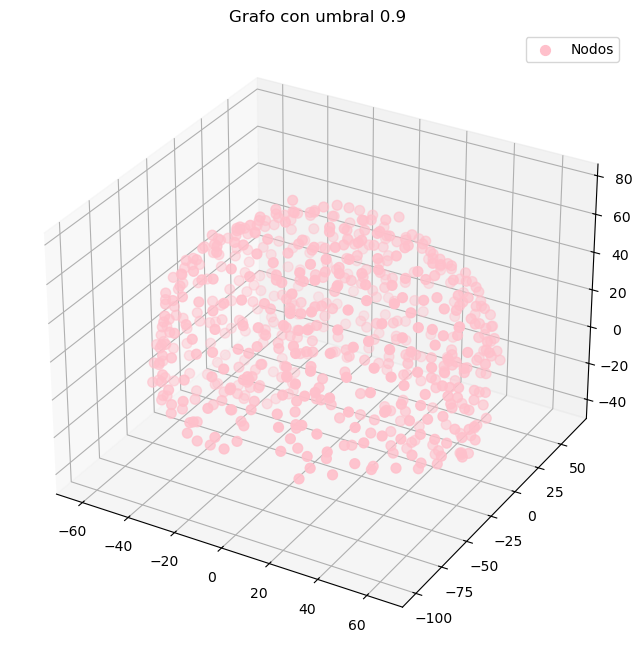

Grafo con umbral 1.0: 0 aristas y 638 nodos.


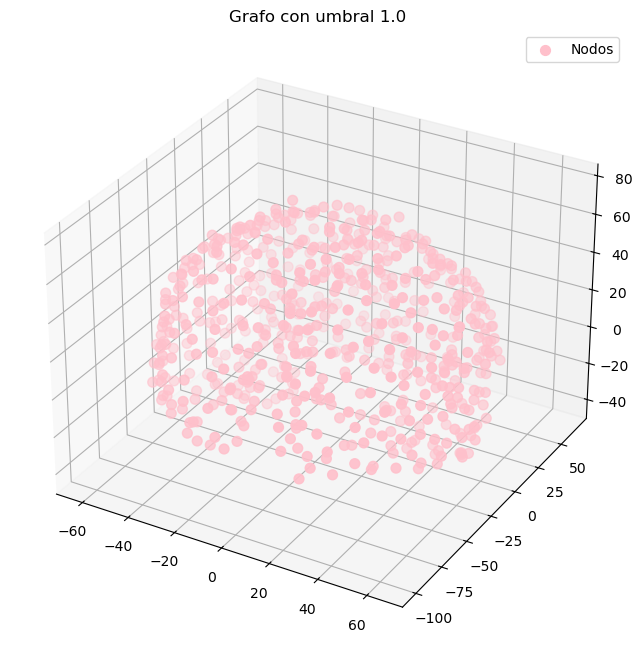

In [152]:
# Función -> grafos
def generate_graph(mat, umbral, coordenadas):
    # Mat. adj. binaria
    matadj = (mat >= umbral).astype(int)
    np.fill_diagonal(matadj, 0)

    G = nx.from_numpy_array(matadj)
    
    # Coordenadas 3D -> nodos
    for i, coord in enumerate(coordenadas):
        G.nodes[i]['pos'] = coord

    return G

# Umbrales 0.8, 0.9 y 1.0
umbrales = [0.8, 0.9, 1.0]
graph = {umbral: generate_graph(comat, umbral, coordenadas) for umbral in umbrales}

# Grafo 3D
def plot_graph_3d(G, title):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Posiciones
    positions = nx.get_node_attributes(G, 'pos')
    if not positions:
        print("Las posiciones 3D en los nodos no están definidas.")
        return
    
    x, y, z = np.array(list(positions.values())).T

    #GRAFICAR
    # Nodos 
    ax.scatter(x, y, z, c='pink', s=50, label='Nodos')

    # Aristas
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='b', alpha=0.5)

    ax.set_title(title)
    plt.legend()
    plt.show()

# Graficar los grafos generados
for umbral, graph in graphs.items():
    print(f"Grafo con umbral {umbral}: {graph.number_of_edges()} aristas y {graph.number_of_nodes()} nodos.")
    plot_graph_3d(graph, f"Grafo con umbral {umbral}")

In [153]:
# EJERCICIO 2
# Con uno de los grafos en el punto uno con umbral 0.9, generar una animación donde se haga girar 360° el grafo del cerebro para visualizar
# las conexiones establecidas

In [155]:
from matplotlib.animation import FuncAnimation
def animacion_grafo(G, ej2):
    fig = plt.figure()
    ax= fig.add_subplot(111, projection ='3d')
    pos= nx.get_node_attributes(G, 'pos')
    x, y, z= np.array(list(pos.values())).T
    
    #nodos y aristas
    scatter= ax.scatter(x,y,z, c='purple', s=20, label='Nodos')
    lines = []
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]],pos[edge[1]])
        lines.append(ax.plot( x_edge, y_edge, z_edge, c= 'b', alpha= 0.5)[0])
        
    ax.set_title("Grafo con umbral 0.9")
    
    # rotación, animación y guardar imagen
    def update(frame):
        ax.view_init(elev=10, azim=frame)
        return scatter, *lines
        
    animation = FuncAnimation(fig, update, frames= np.arange(0, 360, 2), interval= 50, blit= False)
    
    animation.save(ej2, writer='pillow', fps=20)
    plt.close(fig)

r_archivo = r"C:\Users\melan\OneDrive\Documentos\Escuela\grafo09.gif"
grafo09= graphs[0.9]
animacion_grafo(grafo09, r_archivo)

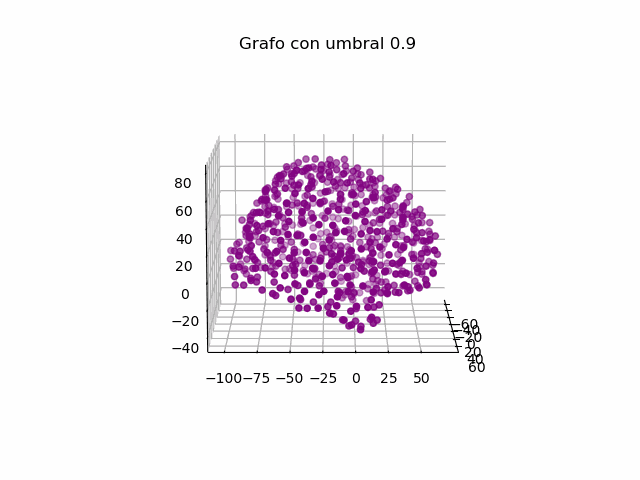

In [156]:
from IPython.display import Image
Image(r"C:\Users\melan\OneDrive\Documentos\Escuela\grafo09.gif") 

In [217]:
#  EJERCICIO 3. Encontrar los hubs del grafo, y establecer el tamaño del nodo proporcional al valor del grado

Grados de los nodos: {0: 0, 1: 0, 2: 1, 3: 1, 4: 0, 5: 1, 6: 0, 7: 1, 8: 1, 9: 1, 10: 0, 11: 1, 12: 1, 13: 0, 14: 0, 15: 0, 16: 1, 17: 0, 18: 0, 19: 1, 20: 0, 21: 0, 22: 0, 23: 1, 24: 0, 25: 1, 26: 0, 27: 1, 28: 0, 29: 0, 30: 0, 31: 0, 32: 0, 33: 0, 34: 0, 35: 1, 36: 0, 37: 0, 38: 2, 39: 0, 40: 0, 41: 1, 42: 2, 43: 1, 44: 0, 45: 1, 46: 1, 47: 0, 48: 0, 49: 1, 50: 0, 51: 0, 52: 0, 53: 1, 54: 1, 55: 0, 56: 0, 57: 0, 58: 0, 59: 0, 60: 0, 61: 0, 62: 2, 63: 1, 64: 0, 65: 0, 66: 1, 67: 0, 68: 0, 69: 2, 70: 1, 71: 1, 72: 0, 73: 1, 74: 0, 75: 0, 76: 0, 77: 0, 78: 1, 79: 0, 80: 0, 81: 1, 82: 0, 83: 1, 84: 0, 85: 0, 86: 1, 87: 0, 88: 0, 89: 1, 90: 0, 91: 0, 92: 2, 93: 0, 94: 1, 95: 0, 96: 0, 97: 1, 98: 0, 99: 0, 100: 0, 101: 1, 102: 0, 103: 0, 104: 0, 105: 1, 106: 0, 107: 0, 108: 0, 109: 0, 110: 0, 111: 1, 112: 0, 113: 1, 114: 0, 115: 0, 116: 0, 117: 1, 118: 0, 119: 1, 120: 0, 121: 1, 122: 0, 123: 1, 124: 2, 125: 0, 126: 1, 127: 1, 128: 1, 129: 0, 130: 1, 131: 0, 132: 0, 133: 0, 134: 0, 135: 1, 

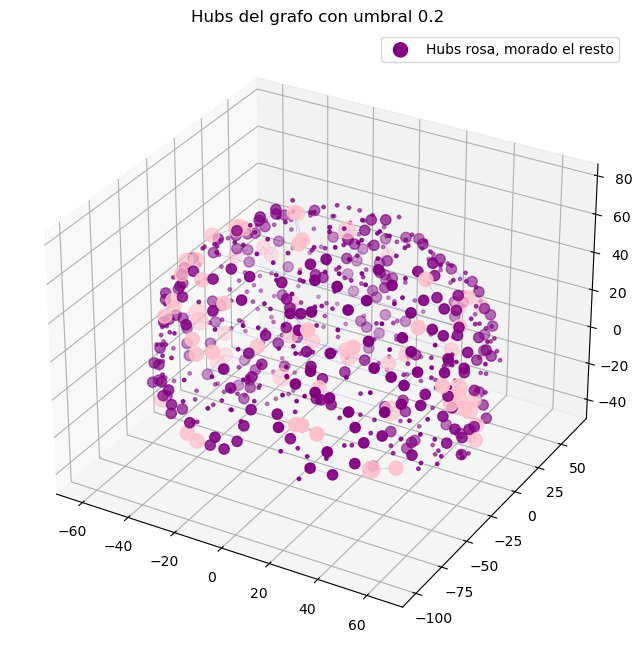

In [261]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

def plot_hubs(G, titulo):
    #Posiciones de los nodos (obtenerlas)
    pos = nx.get_node_attributes(G, 'pos')
    x, y, z = np.array(list(pos.values())).T

    # Calcular grados de los nodos
    grados = dict(G.degree())
    print("Grados de los nodos:", grados)

    # Evitar división por cero => me estaba dando este error y para evitarlo
    gradomax = max(grados.values()) if grados and max(grados.values()) > 0 else 1  
    print(f"Grado máximo: {gradomax}")

    # Calcular tamaño de nodos proporcional al grado
    tamano_min, tamano_max = 6, 200  
    tamano_nodo = [
        tamano_min + (grado / gradomax) * (tamano_max - tamano_min) for grado in grados.values()
    ]

    # Verificar los tamaños calculados
    print(f"Tamaño de nodos calculado: {tamano_nodo}")

    # Calcular el percentil 90 para el umbral
    umbral = np.percentile(list(grados.values()), 90) if grados else 0
    print(f"Umbral (percentil 90): {umbral}")

    # Encontrar hubs 
    nodos_hubs = [node for node, grado in grados.items() if grado >= umbral]
    print(f"Nodos hubs: {nodos_hubs}")

    # Asignar colores -> rosa para hubs
    nodecol = ['pink' if node in nodos_hubs else 'purple' for node in G.nodes()]
    print("Colores de los nodos:", nodecol)

    # Figura 3D
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Nodos
    scatter = ax.scatter(x, y, z, c=nodecol, s=tamano_nodo, label='Nodos')

    # Aristas
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='b', alpha=0.5, linewidth=0.2)

    # Especificaciones gráfica
    ax.set_title(titulo)
    ax.legend(["Hubs rosa, morado el resto"])
    plt.show()

# Llamar función
grafo02 = generate_graph(comat, 0.2, coordenadas) 
plot_hubs(grafo02, "Hubs del grafo con umbral 0.2")


In [265]:
# EJERCICIO 4. En función de la matriz de emparejamiento (correlación de la matriz de adyacencia), 
# establecer una partición de los nodos en módulos. Escoger el número de módulos que creas conveniente
# y justificar por qué escogiste ese número.

In [269]:
!pip install python-louvain

     ---------------------------------------- 0.0/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ------ --------------------------------- 30.7/204.6 kB ? eta -:--:--
     ----------- ------------------------- 61.4/204.6 kB 409.6 kB/s eta 0:00:01
     ----------- ------------------------- 61.4/204.6 kB 409.6 kB/s eta 0:00:01
     ----------- ------------------------- 61.4/204.6 kB 409.6 kB/s eta 0:00:01
     ------------------------- ---------- 143.4/204.6 kB 568.9 kB/s eta 0:00:01
     ------------------------- ---------- 143.4/204.6 kB 568.9 kB/s eta 0:00:01
     ---------------------------------- - 194.6/204.6 kB 537.4 kB/s eta 0:00:01
     ------------------------------------ 204.6/204.6 kB 541.5 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for python-louvain: filename=python_louvain-0.16-py3-none-any.whl size=9403 sha256=a8639d153b6388d73a

In [271]:
import community as community_louvain
import seaborn as sns

Matriz de adyacencia calculada
Matriz de emparejamiento calculada


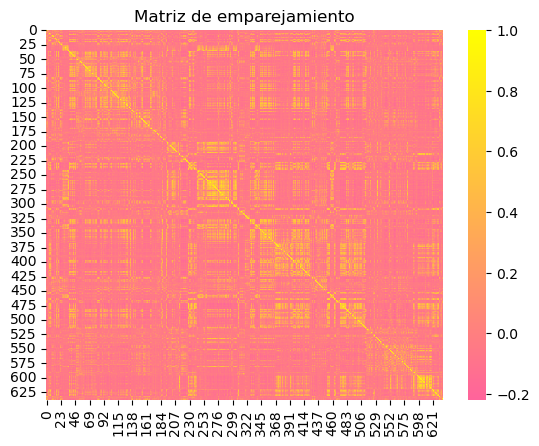

Calculando la partición de los nodos en módulos 
Partición calculada: {0: 2, 1: 2, 2: 3, 3: 3, 4: 2, 5: 0, 6: 0, 7: 3, 8: 2, 9: 2, 10: 0, 11: 2, 12: 0, 13: 2, 14: 2, 15: 0, 16: 3, 17: 2, 18: 0, 19: 3, 20: 0, 21: 2, 22: 2, 23: 2, 24: 2, 25: 1, 26: 1, 27: 1, 28: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 34: 1, 35: 1, 36: 1, 37: 0, 38: 3, 39: 0, 40: 4, 41: 0, 42: 3, 43: 0, 44: 3, 45: 3, 46: 0, 47: 4, 48: 4, 49: 4, 50: 4, 51: 4, 52: 2, 53: 2, 54: 2, 55: 4, 56: 2, 57: 3, 58: 2, 59: 4, 60: 4, 61: 4, 62: 3, 63: 4, 64: 4, 65: 4, 66: 3, 67: 4, 68: 4, 69: 3, 70: 3, 71: 4, 72: 4, 73: 3, 74: 4, 75: 3, 76: 3, 77: 3, 78: 4, 79: 3, 80: 3, 81: 2, 82: 2, 83: 2, 84: 2, 85: 2, 86: 2, 87: 3, 88: 3, 89: 3, 90: 2, 91: 3, 92: 3, 93: 3, 94: 3, 95: 3, 96: 3, 97: 3, 98: 3, 99: 2, 100: 3, 101: 2, 102: 3, 103: 3, 104: 3, 105: 2, 106: 3, 107: 3, 108: 2, 109: 3, 110: 3, 111: 3, 112: 3, 113: 3, 114: 3, 115: 3, 116: 3, 117: 2, 118: 3, 119: 3, 120: 3, 121: 3, 122: 3, 123: 3, 124: 3, 125: 3, 126: 3, 127: 3, 128: 3, 129: 3,

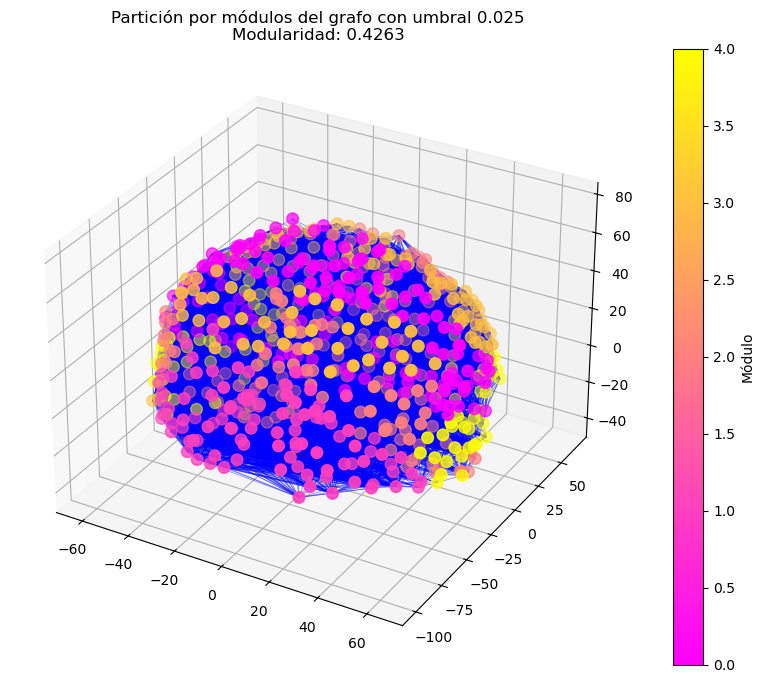

In [300]:
def modulos(G, ej4):
    # Matriz de adyacencia
    matadj = nx.to_numpy_array(G)
    print("Matriz de adyacencia calculada")

    # Matriz de emparejamiento 
    corrmat = np.corrcoef(matadj)
    print("Matriz de emparejamiento calculada")

    # Visualizar
    sns.heatmap(corrmat, cmap="spring", center=0)
    plt.title("Matriz de emparejamiento")
    plt.show()

    # Partición por módulos usando el algoritmo de Louvain
    print("Calculando la partición de los nodos en módulos ")
    particion = community_louvain.best_partition(G)
    print("Partición calculada:", particion)

    # Color de nodos según su módulo
    nodcol = list(particion.values())

    # Cálculo de modularidad
    modularidad = community_louvain.modularity(particion, G)
    print(f"Modularidad: {modularidad:.4f}")

    # Figura en 3D
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Obtener posiciones de los nodos
    pos = nx.get_node_attributes(G, 'pos')
    if not pos:
        raise ValueError("El grafo no tiene posiciones 3D asignadas a los nodos.")

    x, y, z = np.array(list(pos.values())).T

    # Graficar los nodos
    scatter = ax.scatter(x, y, z, c=nodcol, cmap="spring", s=70, label='Nodos')

    # Graficar las aristas
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='b', alpha=0.5, linewidth=0.5)

    # Título y leyenda
    ax.set_title(f"{ej4}\nModularidad: {modularidad:.4f}")
    plt.colorbar(scatter, ax=ax, label="Módulo")
    plt.show()

# Grafo con umbral 0.1
grafo_025 = generate_graph(comat, 0.025, coordenadas)

# Partición por módulos y graficar
modulos(grafo_025, "Partición por módulos del grafo con umbral 0.025")

In [296]:
#Mi elección se basa en el cálculo de la modularidad para checar agrupación de los nodos dentro de cada módulo. 
#Si aumentaba los módulos, la modularidad también aumentaba y no salía bien. 
#Principalmente me basé en qué tamn bien se veía el grafo.


In [302]:
# EJERCICIO 5
# Determinar el conjunto del Rich Club y discutir las implicaciones anatómicas y
# funcionales de este grupo de nodos (mínimo 100 palabras).

Nodos con grado ≥ 10): [38, 70, 186, 230, 235, 253, 262, 328, 330, 334, 346, 356, 362, 397, 400, 407, 416, 454, 473, 477, 481, 482, 485, 488, 491, 494, 532, 599, 603, 606, 607, 616, 617, 619, 629]


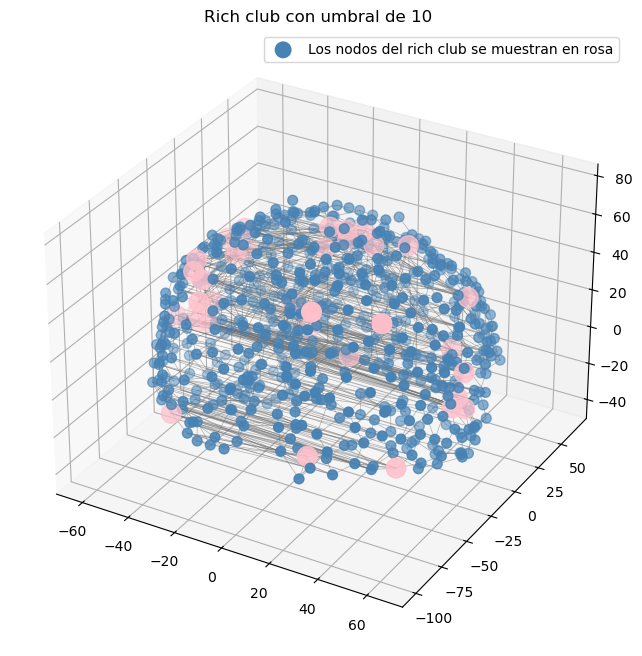

In [324]:
def rich_club(G, ej5, min_degree=10):
    
    # grados de los nodos
    grados= dict(G.degree())
    
    #selección de nodos con grado >= min_degree
    rc_nodes= [node for node, degree in grados.items() if degree >= min_degree]
    print(f"Nodos con grado ≥ {min_degree}): {rc_nodes}")


    if not rc_nodes:
        print("No hay nodos ≥", min_degree)

    # posiciones de los nodos
    pos= nx.get_node_attributes(G, 'pos')
    x,y,z = np.array(list(pos.values())).T

    # colores y tamaños
    node_color = ['pink' if node in rc_nodes else 'steelblue' for node in G.nodes()]
    node_sizes = [200 if node in rc_nodes else 50 for node in G.nodes()]

    # crear figura en 3d
    fig= plt.figure(figsize=(12,8))
    ax= fig.add_subplot(111, projection='3d')

    # graficar nodos 
    ax.scatter(x, y, z, c=node_color, s=node_sizes, label='Nodos')

    # Graficar aristas
    for edge in G.edges():
        if edge[0] in pos and edge[1] in pos:
            x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
            ax.plot(x_edge, y_edge, z_edge, c='dimgrey', alpha=0.5, linewidth=0.5)

    # Configurar título
    ax.set_title(ej5)
    plt.legend(["Los nodos del rich club se muestran en rosa"])
    plt.show()

# grafo
grafo01= generate_graph(comat, 0.1, coordenadas)

rich_club(grafo01, "Rich club con umbral de 10", min_degree=10)
#%%


In [402]:
# Discusión
# El Rich Club es básicamente un grupo de nodos súper conectados, muy importantes porque ayudan al cerebro a integrar toda la información que recibe. 
# en el cererbo son como lugarescomo la corteza prefrontal y otras áreas importantes que están súper activas.
# Estos nodos facilitan la comunicación entre los diferentes módulos del cerebro, como centros de control que conectan todo.
# Hablando de la parte funcional, el Rich Club es importante para cosas complejas cotidianas: 
# tomar decisiones, recordar cosas importantes o concentrarnos en algo. 
# Sin estos nodos súper conectados, nuestro cerebro no sería tan bueno manejando tareas complicadas.

In [405]:
# EJERCICIO 6
# Supongamos que eliminamos los nodos del RichClub, describir cómo cambian las
# propiedades topológicas del grafo, hacer comparativas del grado, coeficiente de
# cluster, coeficiente de mundo pequeño y las medidas de centralidad 
# (cercanía,intermediación)

Calcular las propiedades del grafo original:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': 0.1194031264903796, 'centralidad_intermediacion': 0.01147712930871217}
Nodos del Rich Club (grado ≥ 10): [38, 70, 186, 230, 235, 253, 262, 328, 330, 334, 346, 356, 362, 397, 400, 407, 416, 454, 473, 477, 481, 482, 485, 488, 491, 494, 532, 599, 603, 606, 607, 616, 617, 619, 629]

Calculando las propiedades del grafo sin el Rich Club:
{'grado_medio': 3.691542288557214, 'coeficiente_de_agrupamiento': 0.22183658427439523, 'centralidad_cercania': 0.09214115900724197, 'centralidad_intermediacion': 0.016110568269096143}

Comparación de propiedades:
Grado_medio:
  Original: 4.5298
  Modificado: 3.6915
  Cambio: -18.51%

Coeficiente_de_agrupamiento:
  Original: 0.2436
  Modificado: 0.2218
  Cambio: -8.95%

Centralidad_cercania:
  Original: 0.1194
  Modificado: 0.0921
  Cambio: -22.83%

Centralidad_intermediacion:
  Original: 0.0115
  Modific

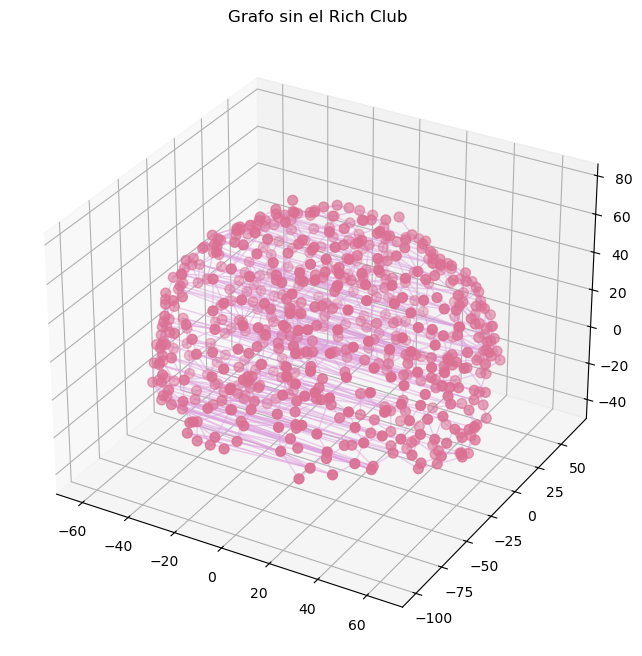

In [407]:
def propiedades_grafo(G):
    propiedades = {}

    # Average grade
    avg_grad = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grad

    # Coeficiente de cluster
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # Centralidad de cercanía 
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # Centralidad de intermediación
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):
    """
    Compara las propiedades del grafo original y el modificado.
    """
    print("\nComparación de propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

# hacer grafo original
grafo_original = generate_graph(comat, 0.1, coordenadas)
grados = dict(grafo_original.degree())

# calcular las propiedades iniciales
print("Calcular las propiedades del grafo original:")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# selección de nodos del Rich Club
min_degree = 10
rc_nodes = [node for node, degree in grados.items() if degree >= min_degree]
print(f"Nodos del Rich Club (grado ≥ {min_degree}): {rc_nodes}")

# copiar grafo y eliminar nodos del Rich Club
grafomodificado = grafo_original.copy()
grafomodificado.remove_nodes_from(rc_nodes)

# calcular las propiedades del grafo modificado
print("\nCalculando las propiedades del grafo sin el Rich Club:")
datos_modificados = propiedades_grafo(grafomodificado)
print(datos_modificados)

# comparar propiedades
comparacion_propiedades(datos_originales, datos_modificados)

# grafo modificado sin el Rich Club
def plot_grafo(G, titulo):
    pos = nx.get_node_attributes(G, 'pos')
    x, y, z = np.array(list(pos.values())).T

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # graficar nodos y aristas
    scatter = ax.scatter(x, y, z, c='palevioletred', s=50)
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='plum', alpha=0.5, linewidth=1)

    ax.set_title(titulo)
    plt.show()

plot_grafo(grafomodificado, "Grafo sin el Rich Club")
#%%


In [408]:
#EJERCICIO 7
# Quitar 10%-50% de los nodos con mayor medida de intermediación y describir cómo cambian las propiedades topológicas del grafo, 
# hacer comparativas del grado, coeficiente de cluster, coeficiente de mundo pequeño y las medidas de centralidad
# (cercanía, intermediación)

Calculo de las propiedades del grafo original: 
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': 0.1194031264903796, 'centralidad_intermediacion': 0.01147712930871217}
Eliminando el 10.0% de los nodos con mayor intermediación: [334, 277, 276, 235, 400, 272, 353, 121, 38, 482, 230, 154, 284, 160, 41, 196, 532, 286, 629, 473, 159, 202, 598, 485, 330, 356, 195, 367, 271, 480, 494, 50, 454, 281, 488, 312, 220, 619, 344, 128, 427, 618, 565, 16, 153, 315, 405, 2, 186, 285, 303, 599, 3, 237, 0, 318, 346, 481, 431, 597, 434, 432, 302]
Eliminando el 20.0% de los nodos con mayor intermediación: [334, 277, 276, 235, 400, 272, 353, 121, 38, 482, 230, 154, 284, 160, 41, 196, 532, 286, 629, 473, 159, 202, 598, 485, 330, 356, 195, 367, 271, 480, 494, 50, 454, 281, 488, 312, 220, 619, 344, 128, 427, 618, 565, 16, 153, 315, 405, 2, 186, 285, 303, 599, 3, 237, 0, 318, 346, 481, 431, 597, 434, 432, 302, 496, 584, 97, 491, 69, 275, 580, 591, 65

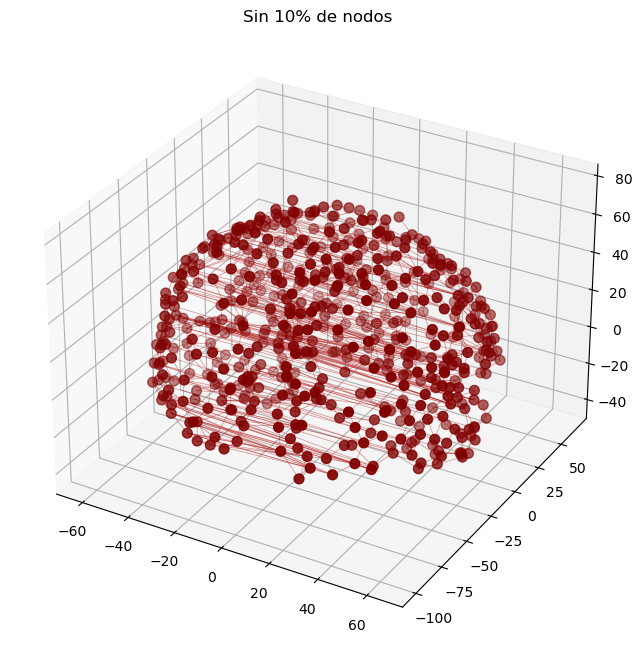

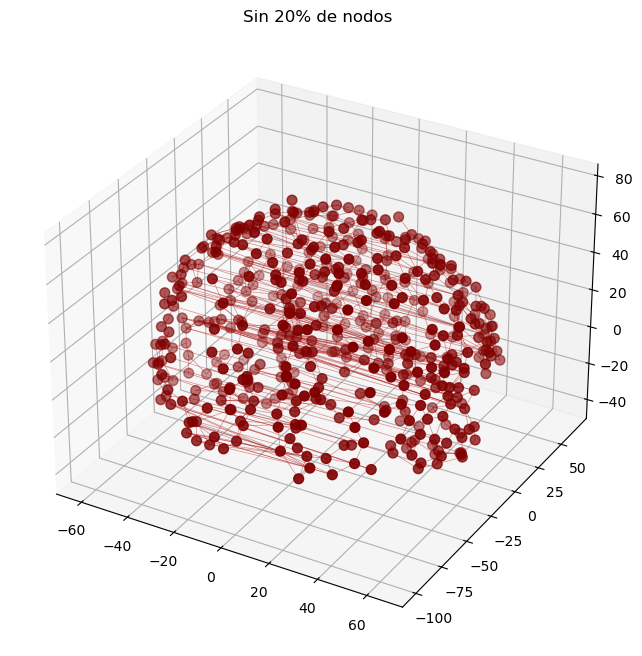

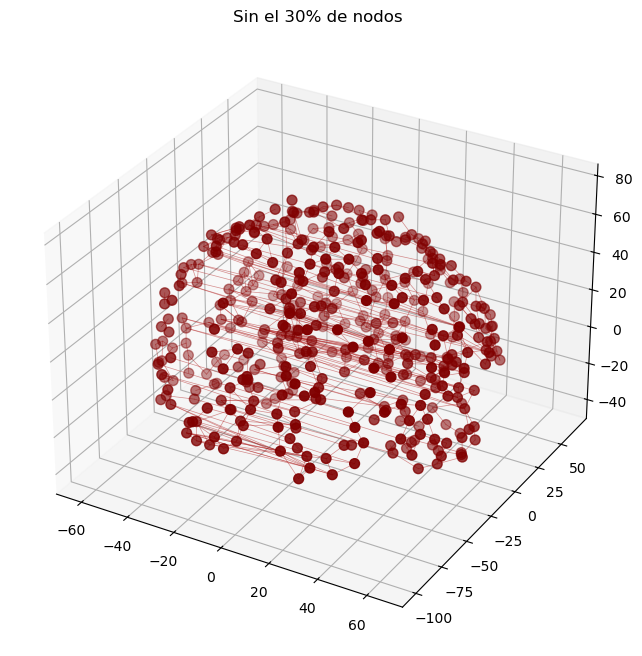

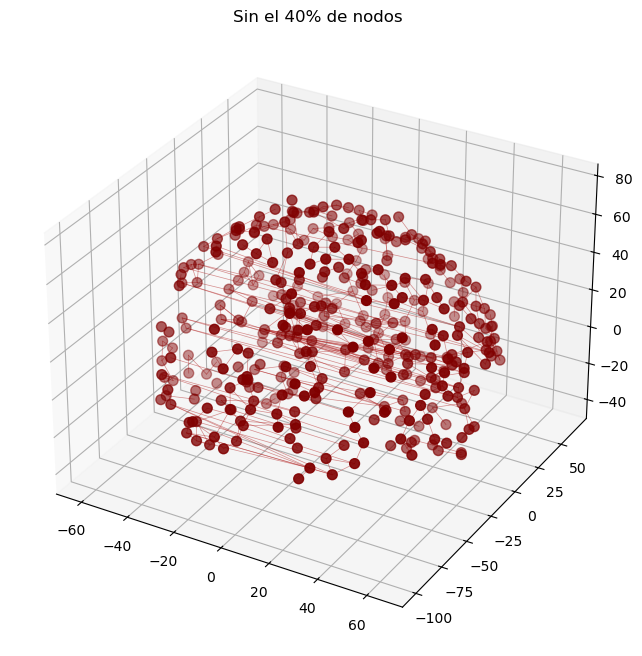

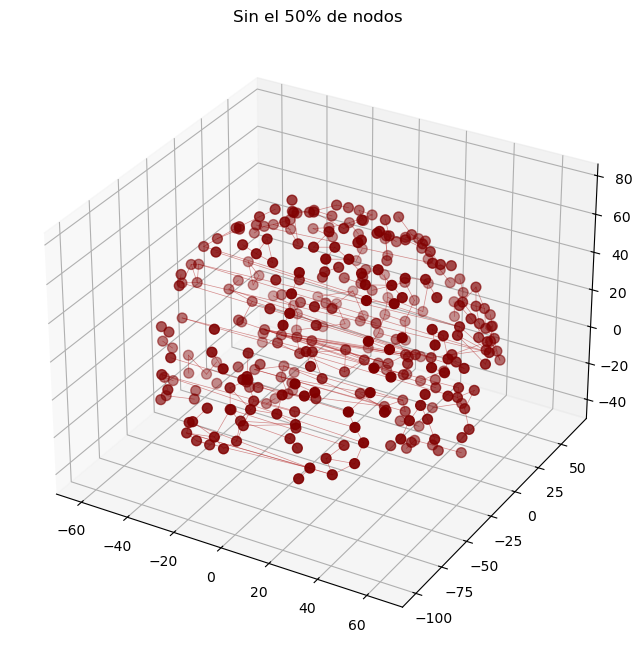

In [409]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

def propiedades_grafo(G):
    propiedades = {}

    # Average grade
    avg_grade = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grade

    # Coeficiente de agrupamiento 
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # Centralidad de cercanía 
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # Centralidad de intermediación 
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):
    """
    Compara las propiedades del grafo original y el modificado.
    """
    print("\nComparación de propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

# Crear función que elimine un porcentaje de nodos
def eliminar_porcentaje(G, percentaje=0.1):
    """
    Elimina un porcentaje de los nodos con mayor centralidad de intermediación.
    
    Args:
        G (networkx.Graph): Grafo original.
        percentaje (float): Porcentaje de nodos a eliminar (entre 0 y 1).
    
    Returns:
        grafo_modificado (networkx.Graph): Grafo con los nodos eliminados.
    """
    # Centralidad de intermediación
    betweenness = nx.betweenness_centrality(G)

    # Ordenar los nodos por centralidad de intermediación de mayor a menor
    sorted_nodes = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)

    # Calcular el número de nodos a eliminar
    num_nodos_eliminar = int(len(sorted_nodes) * percentaje)
    nodos_quitar = [node for node, _ in sorted_nodes[:num_nodos_eliminar]]

    # Crear una copia del grafo y eliminar los nodos
    grafo_modificado = G.copy()
    grafo_modificado.remove_nodes_from(nodos_quitar)

    print(f"Eliminando el {percentaje*100}% de los nodos con mayor intermediación: {nodos_quitar}")
    
    return grafo_modificado

# grafo original
grafo_original = generate_graph(comat, 0.1, coordenadas)

# calcular propiedades del grafo original
print("Calculo de las propiedades del grafo original: ")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# eliminar diferentes porcentajes de nodos con más centralidad
percentajes = [0.1, 0.2, 0.3, 0.4, 0.5]
grafo_modificado1 = eliminar_porcentaje(grafo_original, percentaje=percentajes[0])
grafo_modificado2 = eliminar_porcentaje(grafo_original, percentaje=percentajes[1])
grafo_modificado3 = eliminar_porcentaje(grafo_original, percentaje=percentajes[2])
grafo_modificado4 = eliminar_porcentaje(grafo_original, percentaje=percentajes[3])
grafo_modificado5 = eliminar_porcentaje(grafo_original, percentaje=percentajes[4])

# calcular las propiedades de los nuevos grafos
print("\nCalculando propiedades del grafo sin el 10%:")
datos_modificados_10 = propiedades_grafo(grafo_modificado1)
print(datos_modificados_10)

print("\nCalculando propiedades del grafo sin el 20%:")
datos_modificados_20 = propiedades_grafo(grafo_modificado2)
print(datos_modificados_20)

print("\nCalculando propiedades del grafo sin el 30%:")
datos_modificados_30 = propiedades_grafo(grafo_modificado3)
print(datos_modificados_30)

print("\nCalculando propiedades del grafo sin el 40%:")
datos_modificados_40 = propiedades_grafo(grafo_modificado4)
print(datos_modificados_40)

print("\nCalculando propiedades del grafo sin el 50%:")
datos_modificados_50 = propiedades_grafo(grafo_modificado5)
print(datos_modificados_50)

# comparación de propiedades
comparacion_propiedades(datos_originales, datos_modificados_10)
comparacion_propiedades(datos_originales, datos_modificados_20)
comparacion_propiedades(datos_originales, datos_modificados_30)
comparacion_propiedades(datos_originales, datos_modificados_40)
comparacion_propiedades(datos_originales, datos_modificados_50)

# visualización de los grafos modificados
def plot_grafo(G, titulo):
    pos = nx.get_node_attributes(G, 'pos')
    x, y, z = np.array(list(pos.values())).T

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # nodos y aristas
    scatter = ax.scatter(x, y, z, c='maroon', s=50)
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='firebrick', alpha=0.5, linewidth=0.5)

    ax.set_title(titulo)
    plt.show()

# grafos
plot_grafo(grafo_modificado1, "Sin 10% de nodos")
plot_grafo(grafo_modificado2, "Sin 20% de nodos")
plot_grafo(grafo_modificado3, "Sin el 30% de nodos")
plot_grafo(grafo_modificado4, "Sin el 40% de nodos")
plot_grafo(grafo_modificado5, "Sin el 50% de nodos")

In [410]:
# EJERCICIO 8. Generar un modelo nulo aleatorio donde se tenga el mismo número de nodos y el
# mismo número total de conexiones, y comparar sus propiedades con el grafo original del cerebro.

Calculando las propiedades del grafo original:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': 0.1194031264903796, 'centralidad_intermediacion': 0.01147712930871217}
Propiedades del modelo nulo aleatorio:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.005694958124425209, 'centralidad_cercania': 0.22315646535893222, 'centralidad_intermediacion': 0.005344780695649735}

Comparación de propiedades:
Grado_medio:
  Original: 4.5298
  Modificado: 4.5298
  Cambio: 0.00%

Coeficiente_de_agrupamiento:
  Original: 0.2436
  Modificado: 0.0057
  Cambio: -97.66%

Centralidad_cercania:
  Original: 0.1194
  Modificado: 0.2232
  Cambio: 86.89%

Centralidad_intermediacion:
  Original: 0.0115
  Modificado: 0.0053
  Cambio: -53.43%



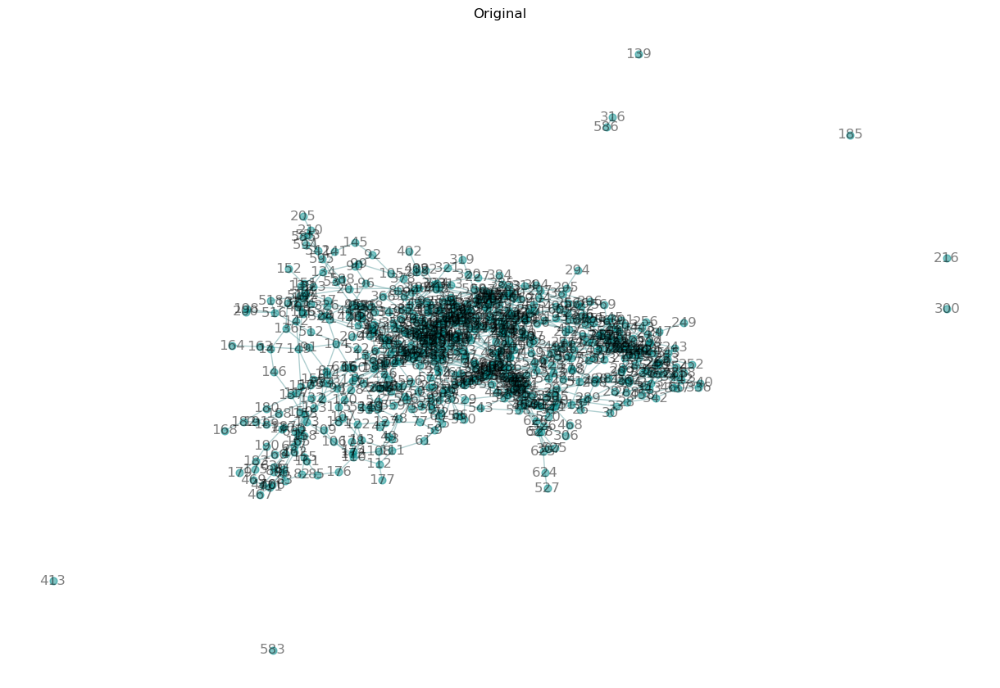

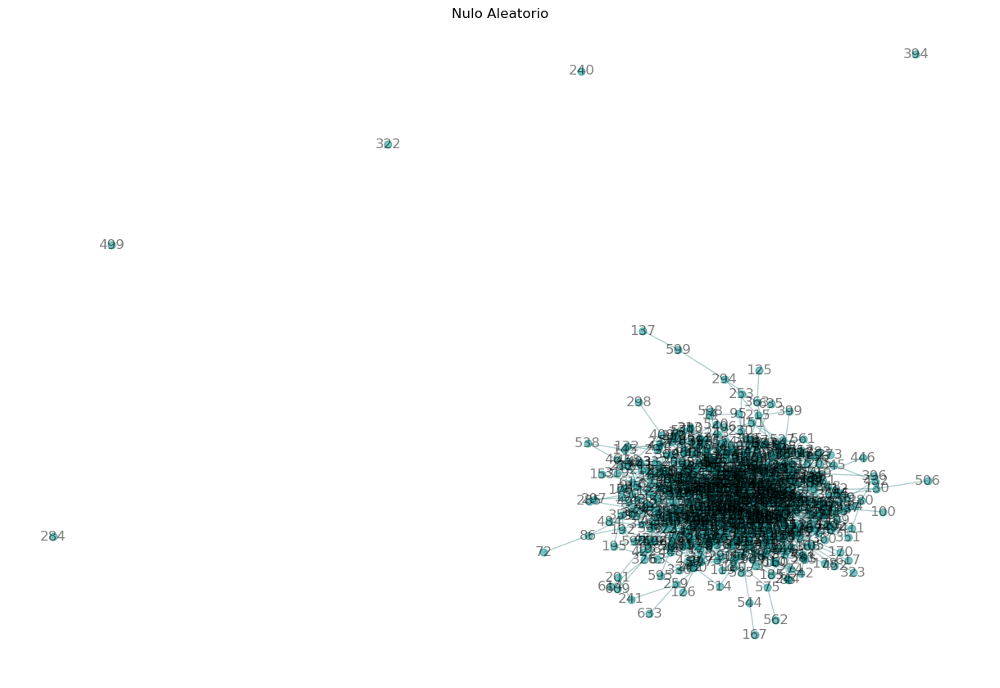

In [411]:
def propiedades_grafo(G):
    propiedades = {}

    # average grade
    avg_grade = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grade

    # coeficiente de agrupamiento 
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # centralidad de cercanía 
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # centralidad de intermediación 
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):
    """
    Compara las propiedades del grafo original y el modificado.
    """
    print("\nComparación de propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")


grafo_original = generate_graph(comat, 0.1, coordenadas)

# propiedades del original
print("Calculando las propiedades del grafo original:")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# para hacer un modelo nulo aleatorio
numero_nodos = grafo_original.number_of_nodes()
numero_aristas = grafo_original.number_of_edges()

# con el mismo número de aristas que el original
modelo_nulo = nx.gnm_random_graph(numero_nodos, numero_aristas)

# propiedades del modelo aleatorio
print("Propiedades del modelo nulo aleatorio:")
datos_nulo = propiedades_grafo(modelo_nulo)
print(datos_nulo)

# comparación de propiedades
comparacion_propiedades(datos_originales, datos_nulo)

# grafo original y modelo nulo aleatorio
def plot_grafo(G, titulo):
    pos = nx.spring_layout(G)  # Layout para visualizar en 2D
    plt.figure(figsize=(12, 8))
    nx.draw(G, pos, with_labels=True, node_color='darkcyan', node_size=40, edge_color='cadetblue', alpha=0.5)
    plt.title(titulo)
    plt.show()
plot_grafo(grafo_original, "Original")
plot_grafo(modelo_nulo, "Nulo Aleatorio")
#%%


In [412]:
# EJERCICIO 9. Generar un modelo nulo aleatorio donde se conserve la distribución de grado y
# comparar sus propiedades con el grafo original del cerebro.

Cálculo de las propiedades del grafo original:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': 0.1194031264903796, 'centralidad_intermediacion': 0.01147712930871217}
Calculamos las propiedades del modelo nulo aleatorio:
{'grado_medio': 4.492163009404389, 'coeficiente_de_agrupamiento': 0.005780935877284761, 'centralidad_cercania': 0.2270149367324883, 'centralidad_intermediacion': 0.005130639413565337}
Comparación de propiedades:
Grado_medio:
  Original: 4.5298
  Modificado: 4.4922
  Cambio: -0.83%

Coeficiente_de_agrupamiento:
  Original: 0.2436
  Modificado: 0.0058
  Cambio: -97.63%

Centralidad_cercania:
  Original: 0.1194
  Modificado: 0.2270
  Cambio: 90.12%

Centralidad_intermediacion:
  Original: 0.0115
  Modificado: 0.0051
  Cambio: -55.30%



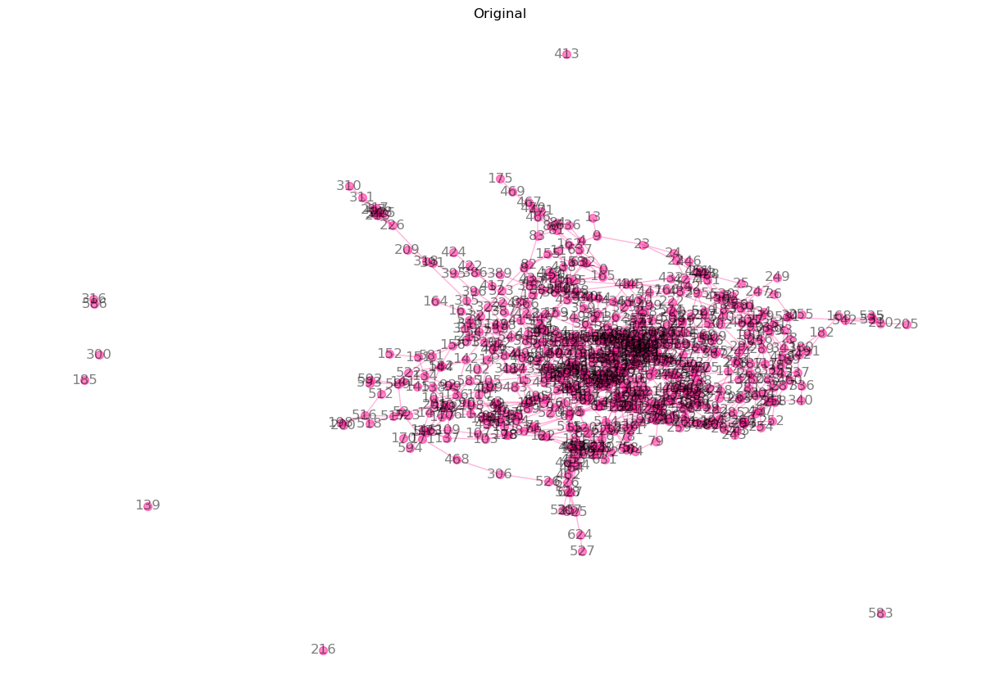

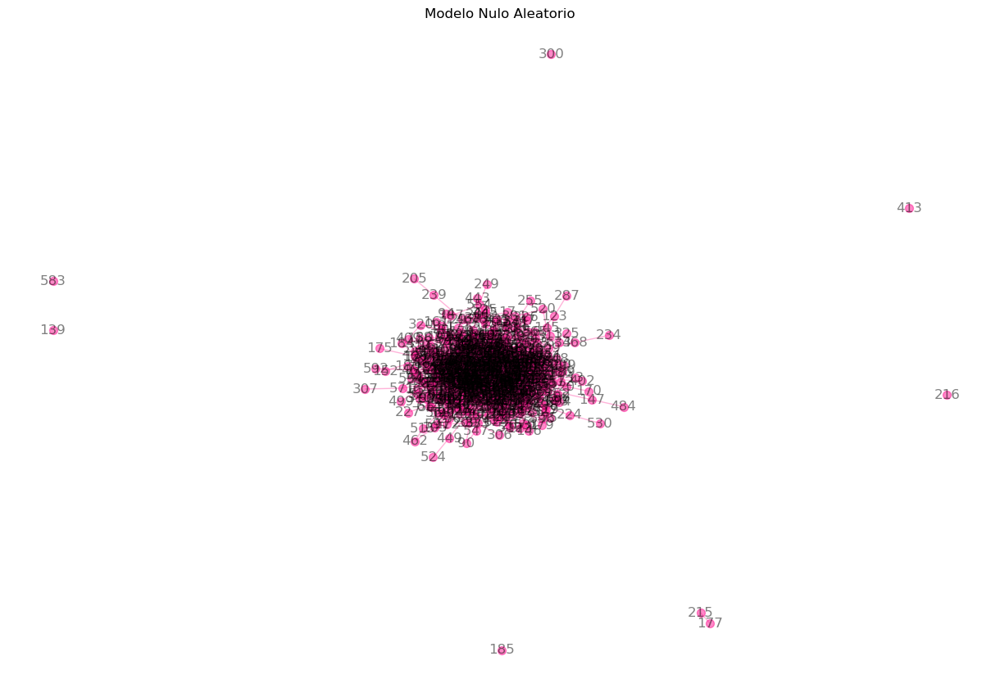

In [413]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

def propiedades_grafo(G):
    propiedades = {}

    # Average grade
    avg_grade = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grade

    # Coeficiente de cluster
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # Centralidad de cercanía
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # Centralidad de intermediación
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):

    print("Comparación de propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

# grafo original
grafo_original = generate_graph(comat, 0.1, coordenadas)

#propiedades grafo original
print("Cálculo de las propiedades del grafo original:")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# crear modelo nulo aleatorio con la misma distribución de grados
modelo_nulo = nx.configuration_model([grafo_original.degree(n) for n in grafo_original.nodes()])

# modelo nulo a grafo simple 
modelo_nulo_multigrafo = nx.configuration_model([grafo_original.degree(n) for n in grafo_original.nodes()])

#eliminar self-loops
modelo_nulo_multigrafo.remove_edges_from(nx.selfloop_edges(modelo_nulo_multigrafo))

# modelo nulo a grafo simple
modelo_nulo = nx.Graph(modelo_nulo_multigrafo)

# propiedades del modelo nulo aleatorio
print("Calculamos las propiedades del modelo nulo aleatorio:")
datos_nulo = propiedades_grafo(modelo_nulo)
print(datos_nulo)

# comparación de propiedades
comparacion_propiedades(datos_originales, datos_nulo)

# grafo original y modelo nulo aleatorio
def plot_grafo(G, titulo):
    pos = nx.spring_layout(G) 
    plt.figure(figsize=(12, 8))
    nx.draw(G, pos, with_labels=True, node_color='deeppink', node_size=50, edge_color='hotpink', alpha=0.5)
    plt.title(titulo)
    plt.show()
plot_grafo(grafo_original, "Original")
plot_grafo(modelo_nulo, "Modelo Nulo Aleatorio")

In [414]:
# EJERCICIO 10. Generar un modelo nulo utilizando una probabilidad de conexión en función de la
# distancia geométrica, con el mismo número de nodos y conexiones y compara sus propiedades y discutir la importancia de las conexiones 
# a larga distancia en el cerebro.

Calculando las propiedades del grafo original:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': 0.1194031264903796, 'centralidad_intermediacion': 0.01147712930871217}
Calcular propiedades del modelo nulo con probabilidad geométrica:
{'grado_medio': 4.492163009404389, 'coeficiente_de_agrupamiento': 0.005780935877284761, 'centralidad_cercania': 0.2270149367324883, 'centralidad_intermediacion': 0.005130639413565337}

Comparación de propiedades:
Grado_medio:
  Original: 4.5298
  Modificado: 4.5298
  Cambio: 0.00%

Coeficiente_de_agrupamiento:
  Original: 0.2436
  Modificado: 0.0562
  Cambio: -76.91%

Centralidad_cercania:
  Original: 0.1194
  Modificado: 0.1876
  Cambio: 57.15%

Centralidad_intermediacion:
  Original: 0.0115
  Modificado: 0.0065
  Cambio: -43.55%



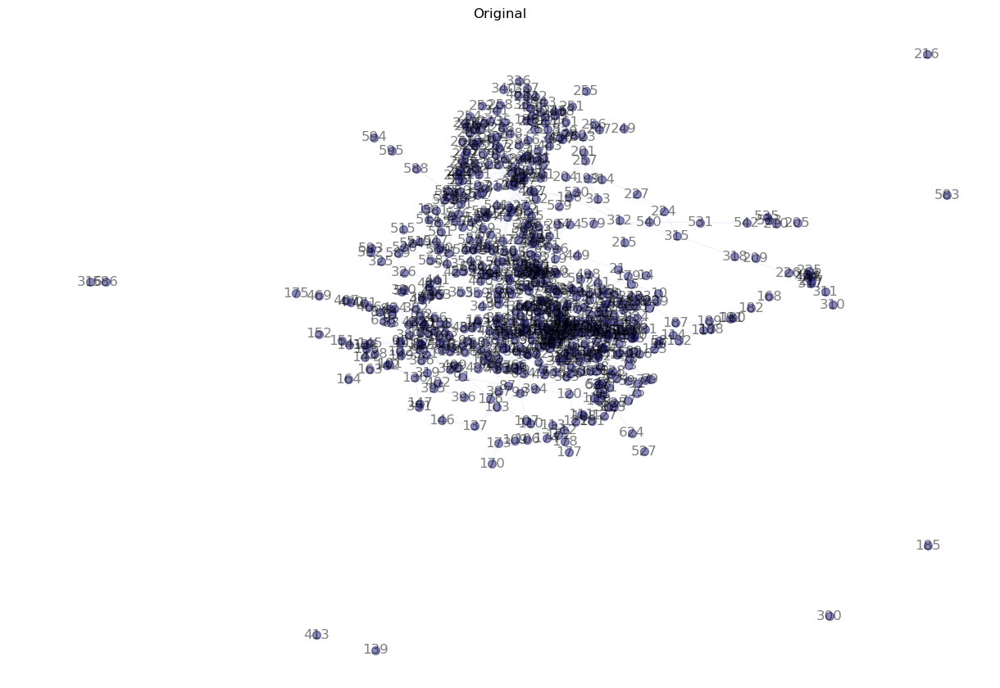

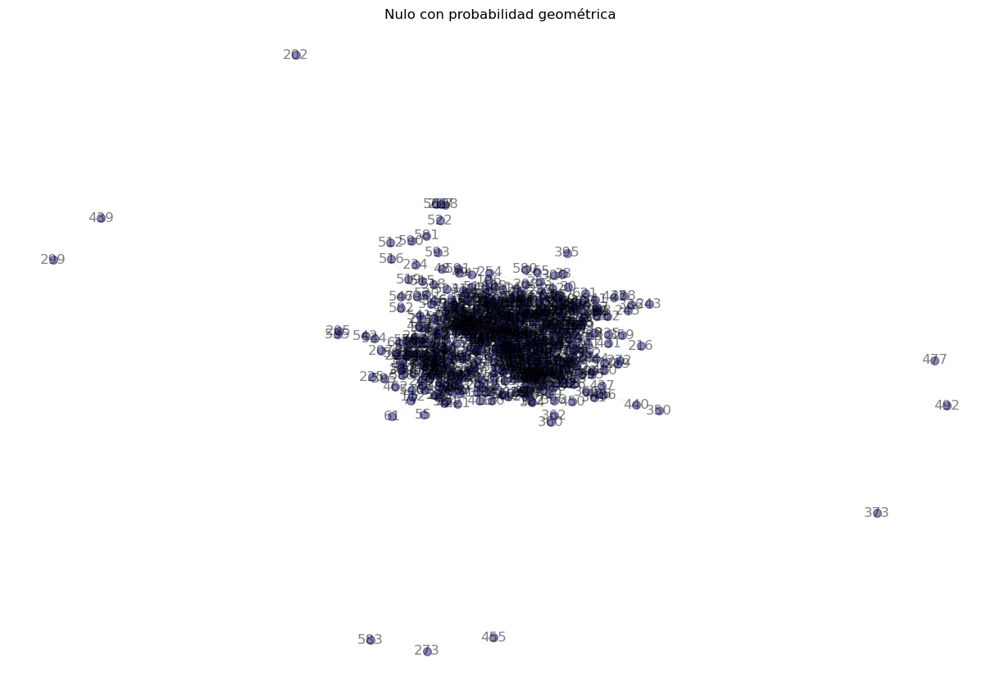

In [417]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

def propiedades_grafo(G):
    propiedades = {}

    # average grade
    avg_grade = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grade

    # coeficiente de cluster
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # centralidad de cercanía
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # centralidad de intermediación
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):

    print("\nComparación de propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

# original
grafo_original = generate_graph(comat, 0.1, coordenadas)

# propiedades del grafo original
print("Calculando las propiedades del grafo original:")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# coordenadas de los nodos
nodos = list(grafo_original.nodes())
pos = nx.get_node_attributes(grafo_original, 'pos')

# matriz de distancias entre nodos
distancias = np.zeros((len(nodos), len(nodos)))
for i in range(len(nodos)):
    for j in range(len(nodos)):
        if i != j:
            distancias[i, j] = np.linalg.norm(np.array(pos[i]) - np.array(pos[j]))

# parámetro de decaimiento para la probabilidad de conexión
alpha = 0.1

# matriz de probabilidades según distancia
probabilidades = np.exp(-alpha * distancias)

# crear modelo nudo en probabilidades de conexión
numero_aristas = grafo_original.number_of_edges()
modelo_nulo = nx.Graph()
modelo_nulo.add_nodes_from(nodos)

# conexiones aleatorias basadas en las probabilidades
aristas = []
while len(aristas) < numero_aristas:
    i, j = np.random.choice(len(nodos), size=2, replace=False)
    if (i, j) not in aristas and (j, i) not in aristas:
        if np.random.rand() < probabilidades[i, j]:
            aristas.append((i, j))

modelo_nulo.add_edges_from(aristas)

# calcular propiedades del modelo nulo
print("Calcular propiedades del modelo nulo con probabilidad geométrica:")
datos_modelonulo = propiedades_grafo(modelo_nulo)
print(datos_nulo)

# comparación de propiedades entre grafo original y el modelo nulo
comparacion_propiedades(datos_originales, datos_modelonulo)

# grafo original y modelo nulo
def plot_grafo(G, titulo):
    pos = nx.spring_layout(G)  # Layout para visualizar en 2D
    plt.figure(figsize=(12, 8))
    nx.draw(G, pos, with_labels=True, node_color='midnightblue', node_size=50, edge_color='lavender', alpha=0.5)
    plt.title(titulo)
    plt.show()
plot_grafo(grafo_original, "Original")
plot_grafo(modelo_nulo, "Nulo con probabilidad geométrica")

In [418]:
#11. RESEÑA DEL CURSO

In [419]:
# Me hubiese gustado que la clase fuera diferente, ya que al menos a mí, me pareció poco efectiva la forma de enseñar,
# aunque también creo que lo que más nos afectó en el aprendizaje fue el horario, al menos para las de Python, al ser 
# nuestra última clase, llegabamos ya cansados y saturados de lo que teníamos antes, además nos atrasamos mucho debido a las personas
# que usaban MacBook y en un punto dejé de comprender lo que estábamos haciendo. Honestamente, tuve que recurrir a IA para que me explicara
# ejercicios y justo por eso siento que no puedo hacer completamente sin ayuda los ejercicios, necesito practicar, incluso para esto Anel tuvo 
# que explicarme muchas cosas y ayudarme cuando me trababa. 

In [420]:
# Respecto a la importancia: La teoría de grafos es una herramienta muy útil para entender cómo se conecta el cerebro. 
# Se representa el cerebro como una red, los nodos son las neuronas o regiones cerebrales y las líneas representan las conexiones entre ellas. 
# Así podemos analizar el funcionamiento y comportamiento de redes neuronales.
# Se pueden identificar hubs (nodos que conectan muchas regiones). Algunas áreas pueden ser representadas como módulos.
# Tiene muchas aplicaciones que nos permiten estudiar cómo cambia el cerebro en diferentes condiciones o eventos, por ejemplo, meuroplasticidad.
